# Introduction

- In this notebook, we visualize and analyze eviction data in NYC using DBSCAN and K-means clustering algorithms. We continue with the previous notebook and visualize in Folium.

- Since the previous notebook has separated the COVID and pre-post-COVID periods, we will continue to analyze these two periods separately. Whenever necessary, we also break the whole of NYC into boroughs. Plot visuals have been proven minimally helpful, and therefore, we rely on Folium for cluster visualizations.  

- We ran DBSCAN on the data and assigned clusters. We analyzed the clusters and realized the limitations of DBSCAN in this case. We also noted the differences between boroughs' clusters.

- Most images not shown here to avoid git large files. All images will also be saved to the images folder.

In [44]:
# !pip install geopandas folium matplotlib seaborn scipy
# !pip install esda
# !pip install splot
# !pip install geopandas contextily
# # for google colab, had to reinstall some pacakges.

In [ ]:
# !pip install geopandas folium matplotlib seaborn scipy esda splot

In [53]:
import pandas as pd
import geopandas as gpd
import numpy as np
import datetime as dt
import scipy

from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from shapely.geometry import Point

# visualization
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
import seaborn as sns
import folium
from folium.plugins import HeatMap
from folium import Marker
from folium.plugins import MarkerCluster
import plotly.express as px
import plotly.io as pio
import contextily as ctx
from scipy.stats import f_oneway

# spatial statistics
from esda.moran import Moran
from esda.getisord import G_Local
from libpysal.weights import Queen, Rook

# system and utility
import warnings
import os
import io
from IPython.display import IFrame
from google.colab import files

from libpysal.weights import Queen, Rook
from esda.moran import Moran
import matplotlib.pyplot as plt
from splot.esda import moran_scatterplot

# suppress warnings
warnings.filterwarnings('ignore')

# inline
%matplotlib inline

In [64]:
pd.set_option('display.float_format', lambda x: '%.4f' % x)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# **Step 1 Get the Eviction data**

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# data source:
file_path1 = '/content/drive/My Drive/X999/evictions_pre_post_covid.csv'
file_path2 = '/content/drive/My Drive/X999/evictions_covid.csv'

In [5]:
evictions_pre_post_raw = pd.read_csv(file_path1)
evictions_covid_raw = pd.read_csv(file_path2)
evictions_covid_raw.shape
# yay 22
# sometimes, it does take extra time and a new runtime for drive to return the updated file.

(6564, 22)

In [6]:
evictions_pre_post = evictions_pre_post_raw.copy()
evictions_covid = evictions_covid_raw.copy()

In [7]:
evictions_pre_post.head(2)

,primary_key,court_index_number,docket_number,eviction_address,eviction_apartment_number,executed_date,borough,eviction_postcode,ejectment,eviction/legal_possession,...,community_board,council_district,census_tract,bin,bbl,nta,year,month_year,geometry,average_year_eviction_count
0,*308072/22_5865,*308072/22,5865,356 MILLER AVE,1 AND BASEMENT,2024-12-04,BROOKLYN,11207,Not an Ejectment,Possession,...,5.0,37.0,1152.0,3083989,3037420029,East New York,2024,2024-12,POINT (-73.891105 40.672121),0.8
1,*313639/23_5202,*313639/23,5202,710 61ST STREET,2ND FLOOR,2024-03-04,BROOKLYN,11220,Not an Ejectment,Possession,...,7.0,38.0,118.0,3143881,3057940012,Sunset Park East,2024,2024-03,POINT (-74.011883 40.635941),0.6


In [8]:
evictions_covid.head(2)

,primary_key,court_index_number,docket_number,eviction_address,eviction_apartment_number,executed_date,borough,eviction_postcode,ejectment,eviction/legal_possession,...,community_board,council_district,census_tract,bin,bbl,nta,year,month_year,geometry,average_year_eviction_count
0,004123/20_209969,004123/20,209969,2541 A GRAND AVE,ROOM 3B,2022-08-22,BRONX,10468,Not an Ejectment,Possession,...,7.0,14.0,265.0,2113173,2032140141,Kingsbridge Heights,2022,2022-08,POINT (-73.901317 40.865396),0.333333
1,0050153/20_106030,0050153/20,106030,98-05 67TH AVENUE,12F,2022-04-14,QUEENS,11375,Not an Ejectment,Possession,...,6.0,29.0,71306.0,4074666,4031560133,Forest Hills,2022,2022-04,POINT (-73.855552 40.724241),0.333333


In [9]:
evictions_pre_post.columns, \
evictions_covid.columns, \
evictions_pre_post.shape, \
evictions_covid.shape

(Index(['primary_key', 'court_index_number', 'docket_number',
        'eviction_address', 'eviction_apartment_number', 'executed_date',
        'borough', 'eviction_postcode', 'ejectment',
        'eviction/legal_possession', 'latitude', 'longitude', 'community_board',
        'council_district', 'census_tract', 'bin', 'bbl', 'nta', 'year',
        'month_year', 'geometry', 'average_year_eviction_count'],
       dtype='object'),
 Index(['primary_key', 'court_index_number', 'docket_number',
        'eviction_address', 'eviction_apartment_number', 'executed_date',
        'borough', 'eviction_postcode', 'ejectment',
        'eviction/legal_possession', 'latitude', 'longitude', 'community_board',
        'council_district', 'census_tract', 'bin', 'bbl', 'nta', 'year',
        'month_year', 'geometry', 'average_year_eviction_count'],
       dtype='object'),
 (76718, 22),
 (6564, 22))

### Skipped these sections and subsections (see notebook part 1)

# **Step 2 DBSCAN and its limitations**

- Density-based spatial clustering of applications with noise (DBSCAN) is a clustering algorithm used in machine learning to partition data into clusters based on their distance to other points. Its effective at identifying and removing noise in a data set, making it useful for data cleaning and outlier detection.

##### https://builtin.com/articles/dbscan#:~:text=What%20Is%20DBSCAN%3F,their%20distance%20to%20other%20points.
##### https://stackoverflow.com/questions/34579213/dbscan-for-clustering-of-geographic-location-data

### Prepare the data for DBSCAN test

- Why didn't log the average eviction data points first?

- We have tried log it first before send the data for further processing, but it only yields one cluster. Therefore logging it just compress the data too much and therefore it is not a good way to process the data in this case

- We chose DBSCAN here, because it does not presumbly ask for the number of clusters, whereas K means does. K means also assume the clusters are in circular form, which may not be the case with geo data

In [10]:
evictions_covid.columns.tolist()

['primary_key',
 'court_index_number',
 'docket_number',
 'eviction_address',
 'eviction_apartment_number',
 'executed_date',
 'borough',
 'eviction_postcode',
 'ejectment',
 'eviction/legal_possession',
 'latitude',
 'longitude',
 'community_board',
 'council_district',
 'census_tract',
 'bin',
 'bbl',
 'nta',
 'year',
 'month_year',
 'geometry',
 'average_year_eviction_count']

In [11]:
# use eviction_count for clustering
eviction_covid_counts = evictions_covid[['average_year_eviction_count']]
eviction_pre_post_counts = evictions_pre_post[['average_year_eviction_count']]

In [12]:
# normalize the eviction_counts
scaler = StandardScaler()
eviction_covid_scaled = scaler.fit_transform(eviction_covid_counts)
eviction_pre_post_scaled = scaler.fit_transform(eviction_pre_post_counts)

In [17]:
# DBSCAN
dbscan = DBSCAN(eps=1, min_samples=3)
evictions_covid['cluster'] = dbscan.fit_predict(eviction_covid_scaled)
evictions_pre_post['cluster'] = dbscan.fit_predict(eviction_pre_post_scaled)

In [24]:
# analyze the number of clusters formed and noise points
n_clusters = len(set(evictions_covid['cluster'])) - (1 if -1 in evictions_covid['cluster'] else 0)
n_noise = list(evictions_covid['cluster']).count(-1)

In [25]:
print("results: number of clusters during covid: ", n_clusters, "number of noise points: ", n_noise)
## no noise, 2 clusters, luckily good

results: number of clusters during covid:  2 number of noise points:  0


In [47]:
evictions_covid.value_counts('cluster')
# so the majority is in cluster 0

,count
cluster,
0,6551
1,13


In [26]:
# analyze the number of clusters formed and noise points
n_clusters = len(set(evictions_pre_post['cluster'])) - (1 if -1 in evictions_pre_post['cluster'] else 0)
n_noise = list(evictions_pre_post['cluster']).count(-1)

In [27]:
print("results: number of clusters during normal times: ", n_clusters, "number of noise points: ", n_noise)
## no noise, 3 clusters, luckily good

results: number of clusters during normal times:  5 number of noise points:  0


In [48]:
evictions_pre_post.value_counts('cluster')
# so the majority is in cluster 0 too

,count
cluster,
0,76209
1,178
4,139
2,103
3,89


In [28]:
# -1 would be noise label
print(evictions_pre_post['cluster'].unique())
print(evictions_covid['cluster'].unique())

[0 1 2 3 4]
[0 1]


In [43]:
evictions_pre_post.to_csv('/content/drive/My Drive/X999/evictions_pre_post_covid_clusters.csv')
evictions_covid.to_csv('/content/drive/My Drive/X999/evictions_covid_clusters.csv')

## **Step 2.1 Let's say what are the thresholds and differences between these clusters (f-statistic)**

In [56]:
clusters_covid = [group['average_year_eviction_count'].values for name, group in evictions_covid.groupby('cluster')]
clusters_pre_post = [group['average_year_eviction_count'].values for name, group in evictions_pre_post.groupby('cluster')]

In [57]:
print(clusters_covid), print(clusters_pre_post)

[array([0.33333333, 0.33333333, 1.        , ..., 0.66666667, 0.66666667,
       0.33333333]), array([4.33333333, 4.33333333, 4.33333333, 4.33333333, 4.33333333,
       4.33333333, 4.33333333, 4.33333333, 4.33333333, 4.33333333,
       4.33333333, 4.33333333, 4.33333333])]
[array([0.8, 0.6, 0.6, ..., 0.2, 0.8, 0.2]), array([35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6,
       35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6,
       35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6,
       35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6,
       35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6,
       35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6,
       35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6,
       35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6,
       35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6,
       35.6, 35.6, 35.6, 

(None, None)

In [58]:
f_stat, p_value = f_oneway(*clusters_covid)
f_stat, p_value
# anova test with f-statistic. a value of 1759 and 42431 are extremely, indicating that there are clusters having numbers at least 10 X than others
# which is the case here.

(np.float64(1759.0519506007277), np.float64(0.0))

In [59]:
f_stat, p_value = f_oneway(*clusters_pre_post)
f_stat, p_value

(np.float64(42431.9615495898), np.float64(0.0))

In [85]:
# cluster_means_covid = evictions_covid.groupby('cluster')['average_year_eviction_count'].mean()
cluster_means_pre_post = evictions_pre_post.groupby('cluster')['average_year_eviction_count'].mean()
# cluster_medians_covid = evictions_covid.groupby('cluster')['average_year_eviction_count'].median()
cluster_medians_pre_post = evictions_pre_post.groupby('cluster')['average_year_eviction_count'].median()
# cluster_stds_covid = evictions_covid.groupby('cluster')['average_year_eviction_count'].std()
cluster_stds_pre_post = evictions_pre_post.groupby('cluster')['average_year_eviction_count'].std()
# cluster_maxs_covid = evictions_covid.groupby('cluster')['average_year_eviction_count'].max()
cluster_maxs_pre_post = evictions_pre_post.groupby('cluster')['average_year_eviction_count'].max()
# cluster_mins_covid = evictions_covid.groupby('cluster')['average_year_eviction_count'].min()
cluster_mins_pre_post = evictions_pre_post.groupby('cluster')['average_year_eviction_count'].min()

In [86]:
cluster_stats_dict = {
    # ('covid', 'mean'): cluster_means_covid,
    ('pre_post', 'mean'): cluster_means_pre_post,
    # ('covid', 'median'): cluster_medians_covid,
    ('pre_post', 'median'): cluster_medians_pre_post,
    # ('covid', 'std'): cluster_stds_covid,
    ('pre_post', 'std'): cluster_stds_pre_post,
    # ('covid', 'max'): cluster_maxs_covid,
    ('pre_post', 'max'): cluster_maxs_pre_post,
    # ('covid', 'min'): cluster_mins_covid,
    ('pre_post', 'min'): cluster_mins_pre_post,
}
# since covid only has two types of the clusters and the overwhelming majority of them are type 0, so we skip them here.

In [87]:
cluster_stats_df = pd.DataFrame(cluster_stats_dict)
cluster_stats_df

pre_post                               
            mean  median    std     max     min
cluster                                        
0         1.0664  0.6000 1.4884 14.8000  0.2000
1        35.6000 35.6000 0.0000 35.6000 35.6000
2        20.6000 20.6000 0.0000 20.6000 20.6000
3        17.8000 17.8000 0.0000 17.8000 17.8000
4        27.8000 27.8000 0.0000 27.8000 27.8000

### **So for the majority is in cluster 0 (the only legit cluster), and the other three types have no variance but just one value, because these values are pretty big. This is likely not ideal for analysis, since they could be misprocess. However, given the fact the only "processing" we have done is using the dbscan function. So maybe dbscan is not the ideal function to run here. Interestingly (and luckily), dbscan actually runs with th [["average_evcition_count"]] selection with the current computation capacity. We will do the same thing to the hdbscan function in another file to see if the results are more conventionally acceptable. In addition, note the type does not have any meanings here, type 1 turns out to be the more severe one than type 4 in this case. So the label was randomly assigned.**

In [83]:
print(evictions_pre_post[evictions_pre_post['cluster'] == 1]['average_year_eviction_count'].unique())

[35.6]


In [81]:
# cluster_means_covid,cluster_means_pre_post, cluster_medians_covid, cluster_medians_pre_post, cluster_stds_covid, cluster_stds_pre_post,\
# cluster_maxs_covid, cluster_maxs_pre_post, cluster_mins_covid, cluster_mins_pre_post

# **Step 2.2 Let's dive into different borough's eviction landscape**

### This also means, we are actually locating the particular types of clusters (the outliers) and where they came from

In [29]:
# manhattan
evictions_manhattan_covid = evictions_covid[evictions_covid['borough'] == 'MANHATTAN']
evictions_manhattan_pre_post = evictions_pre_post[evictions_pre_post['borough'] == 'MANHATTAN']
evictions_manhattan_covid.shape, \
evictions_manhattan_pre_post.shape
# the added column would be the cluster

((992, 23), (12060, 23))

In [31]:
# brooklyn
evictions_brooklyn_covid = evictions_covid[evictions_covid['borough'] == 'BROOKLYN']
evictions_brooklyn_pre_post = evictions_pre_post[evictions_pre_post['borough'] == 'BROOKLYN']
evictions_brooklyn_covid.shape, \
evictions_brooklyn_pre_post.shape

((2268, 23), (21713, 23))

In [32]:
# staten island
evictions_si_covid = evictions_covid[evictions_covid['borough'] == 'STATEN ISLAND']
evictions_si_pre_post = evictions_pre_post[evictions_pre_post['borough'] == 'STATEN ISLAND']
evictions_si_covid.shape, \
evictions_si_pre_post.shape

((332, 23), (2519, 23))

In [33]:
# bronx
evictions_bronx_covid = evictions_covid[evictions_covid['borough'] == 'BRONX']
evictions_bronx_pre_post = evictions_pre_post[evictions_pre_post['borough'] == 'BRONX']
evictions_bronx_covid.shape, \
evictions_bronx_pre_post.shape

((1895, 23), (26701, 23))

In [34]:
# queens
evictions_queens_covid = evictions_covid[evictions_covid['borough'] == 'QUEENS']
evictions_queens_pre_post = evictions_pre_post[evictions_pre_post['borough'] == 'QUEENS']
evictions_queens_covid.shape, \
evictions_queens_pre_post.shape

((1077, 23), (13725, 23))

## **Step 2.3 Analyze each borough's clustering patterns**

In [60]:
bronx_covid_stats = evictions_bronx_covid.groupby('cluster')['average_year_eviction_count'].describe()
bronx_covid_stats

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,1895.0,0.522252,0.321992,0.333333,0.333333,0.333333,0.666667,2.0


In [61]:
bronx_pre_post_stats = evictions_bronx_pre_post.groupby('cluster')['average_year_eviction_count'].describe()
bronx_pre_post_stats
# bronx only has type 0 and type 4,

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,26562.0,1.439568,1.713686e+00,0.2,0.4,1.0,1.8,14.8
4,139.0,27.800000,7.131125e-14,27.8,27.8,27.8,27.8,27.8


In [62]:
brooklyn_covid_stats = evictions_brooklyn_covid.groupby('cluster')['average_year_eviction_count'].describe()
brooklyn_covid_stats
# two types

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,2255.0,0.517960,3.212237e-01,0.333333,0.333333,0.333333,0.666667,2.333333
1,13.0,4.333333,9.244454e-16,4.333333,4.333333,4.333333,4.333333,4.333333


In [65]:
brooklyn_pre_post_stats = evictions_brooklyn_pre_post.groupby('cluster')['average_year_eviction_count'].describe()
brooklyn_pre_post_stats
# two types

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,21535.0000,0.8018,1.1960,0.2000,0.2000,0.4000,0.8000,13.2000
1,178.0000,35.6000,0.0000,35.6000,35.6000,35.6000,35.6000,35.6000


In [ ]:
# evictions_

In [66]:
si_covid_stats = evictions_si_covid.groupby('cluster')['average_year_eviction_count'].describe()
si_covid_stats
# only has one type of eviction clusteirng

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,332.0000,0.6165,0.5534,0.3333,0.3333,0.3333,0.6667,2.6667


In [67]:
si_pre_post_stats = evictions_si_pre_post.groupby('cluster')['average_year_eviction_count'].describe()
si_pre_post_stats
# only has one type of clustering

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,2519.0000,0.8363,1.1972,0.2000,0.2000,0.4000,0.6000,5.6000


In [45]:
queen_covid_stats = evictions_queens_covid.groupby('cluster')['average_year_eviction_count'].describe()
queen_covid_stats
# one type

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,1077.0,0.470443,0.283219,0.333333,0.333333,0.333333,0.666667,2.666667


In [46]:
queen_pre_post_stats = evictions_queens_pre_post.groupby('cluster')['average_year_eviction_count'].describe()
queen_pre_post_stats
# has three type, except the most severe one, type 4

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,13533.0,0.879938,1.295910e+00,0.2,0.2,0.4,0.8,7.4
2,103.0,20.600000,3.927095e-14,20.6,20.6,20.6,20.6,20.6
3,89.0,17.800000,2.858274e-14,17.8,17.8,17.8,17.8,17.8


In [70]:
manhattan_covid_stats = evictions_manhattan_covid.groupby('cluster')['average_year_eviction_count'].describe()
manhattan_covid_stats
# only has one type of evictions clustering

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,992.0000,0.4630,0.2903,0.3333,0.3333,0.3333,0.6667,2.3333


In [72]:
manhattan_pre_post_stats = evictions_manhattan_pre_post.groupby('cluster')['average_year_eviction_count'].describe()
manhattan_pre_post_stats
# only has one type of evictions clustering

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,12060.0000,0.9744,1.5174,0.2000,0.2000,0.6000,1.0000,13.8000


## **In short summary, in different boroughs, we have seen different clustering patterns. In Manhattan and Staten Island, we only observed one type of clustering in both covid and normal times (type 1, the least severe one). However, this does not mean they can't have buildings that had more than 10 evictions per year. Manhattan does during normal time. SI had more than 5 evictions per building per year during normal times. Queens had three types, except type 4, the most severe one, during normal times, and had only type 0 during covid time. Brooklyn had two types, 0 and 1 during both periods. Bronx had type 0 during covid and type 0 and type 4 during normal time, reaching maximum as high as 27.8 evictions per building per year.**

# **Step 3: Plotly (NO need to re-run plotly, visuals not clear enough, see ArcGIS detailed visuals in images folder)**

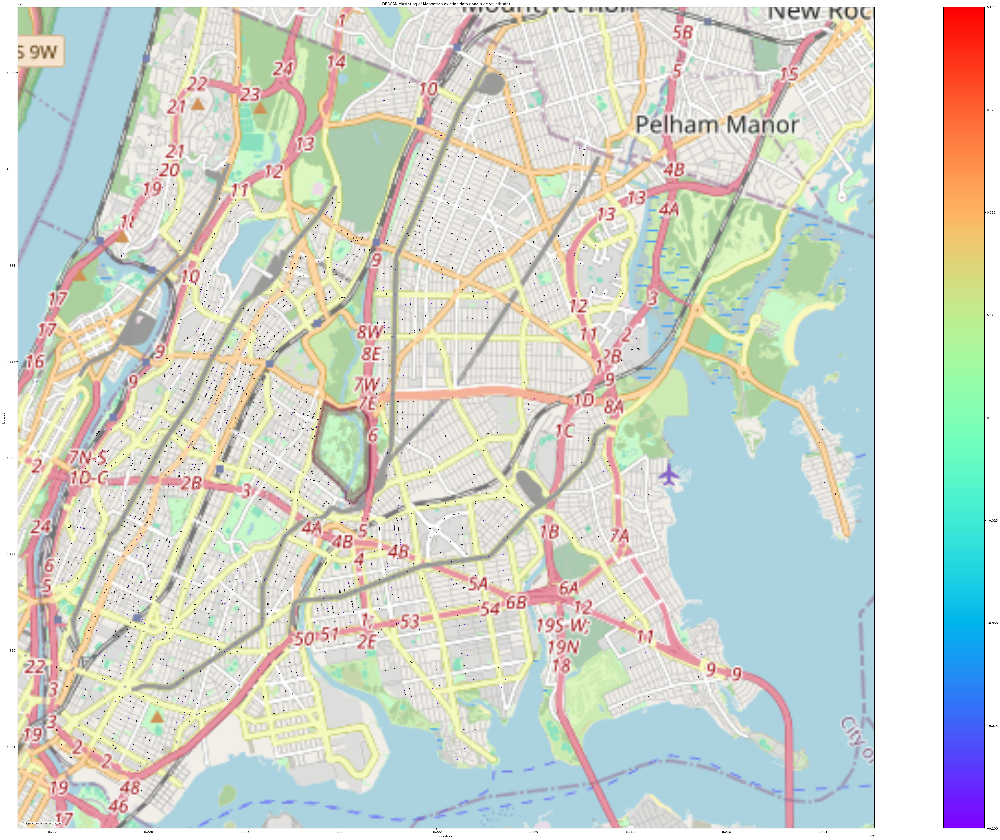

In [89]:
# for better visuals, see ArcGIS visuals in images folder
geometry = [Point(xy) for xy in zip(evictions_bronx_covid['longitude'], evictions_bronx_covid['latitude'])]
evictions_gdf = gpd.GeoDataFrame(evictions_bronx_covid, geometry=geometry, crs="EPSG:4326")

evictions_gdf = evictions_gdf.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(80, 48))
evictions_gdf.plot(ax=ax, column='cluster', cmap='rainbow', legend=True, markersize=7, edgecolor='k')

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, zoom=12)

plt.title('DBSCAN clustering of Manhattan eviction data (longitude vs latitude)')
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.show()

In [ ]:
# from google.colab import files
# from IPython.display import Image
# uploaded = files.upload()
# Image(filename='manhattan_map.png')

In [92]:
# geometry = [Point(xy) for xy in zip(evictions_bronx_pre_post['longitude'], evictions_bronx_pre_post['latitude'])]
# evictions_gdf = gpd.GeoDataFrame(evictions_bronx_pre_post, geometry=geometry, crs="EPSG:4326")

# evictions_gdf = evictions_gdf.to_crs(epsg=3857)
# # even by converting 'cluster' as category type does not help with the different coloring
# # plotly is not a good choice here.
# evictions_gdf['cluster'] = evictions_gdf['cluster'].astype('category')


# fig, ax = plt.subplots(figsize=(80, 48))
# evictions_gdf.plot(ax=ax, column='cluster', cmap='rainbow', legend=True, markersize=7, edgecolor='k')

# ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, zoom=12)

# plt.title('DBSCAN clustering of Manhattan eviction data')
# plt.xlabel('longitude')
# plt.ylabel('latitude')
# plt.show()

# # it's just not very clear

In [ ]:
# os.environ["SHAPE_RESTORE_SHX"] = "YES"
# buildings = gpd.read_file('building.shp')